# Check joined met file(s)

In [13]:
import xarray as xr
import yaml
import glob
import os
import matplotlib.pyplot as plt

In [3]:
with open("config.yaml", "r") as f:
    config = yaml.safe_load(f)
met_path = config.get("met_save_directory")

In [4]:
print("All saved and joined met files:")
os.listdir(met_path)

All saved and joined met files:


['CHINA_Met_201401.nc',
 'CHINA_Met_201402.nc',
 'CHINA_Met_201403.nc',
 'CHINA_Met_201404.nc',
 'CHINA_Met_201405.nc',
 'CHINA_Met_201406.nc',
 'CHINA_Met_201407.nc',
 'CHINA_Met_201408.nc',
 'CHINA_Met_201409.nc',
 'CHINA_Met_201410.nc',
 'CHINA_Met_201411.nc',
 'CHINA_Met_201412.nc',
 'CHINA_Met_201501.nc',
 'CHINA_Met_201502.nc',
 'CHINA_Met_201503.nc',
 'CHINA_Met_201504.nc',
 'CHINA_Met_201505.nc',
 'CHINA_Met_201506.nc',
 'CHINA_Met_201507.nc',
 'CHINA_Met_201508.nc',
 'CHINA_Met_201509.nc',
 'CHINA_Met_201510.nc',
 'CHINA_Met_201511.nc',
 'CHINA_Met_201512.nc',
 'CHINA_Met_201601.nc',
 'CHINA_Met_201602.nc',
 'CHINA_Met_201603.nc',
 'CHINA_Met_201604.nc',
 'CHINA_Met_201605.nc',
 'CHINA_Met_201606.nc',
 'CHINA_Met_201607.nc',
 'CHINA_Met_201608.nc',
 'CHINA_Met_201609.nc',
 'CHINA_Met_201610.nc',
 'CHINA_Met_201611.nc',
 'CHINA_Met_201612.nc',
 'CHINA_Met_201801.nc',
 'CHINA_Met_201802.nc',
 'CHINA_Met_201803.nc',
 'CHINA_Met_201804.nc',
 'CHINA_Met_201805.nc',
 'CHINA_Met_2018

# Plot for a specific met file

In [6]:
filename = os.listdir(met_path)[0]

ds = xr.open_dataset(met_path+filename)

## Plot some variables to check it looks fine

In [8]:
variables = ['x_wind', 'y_wind', 'air_temperature']

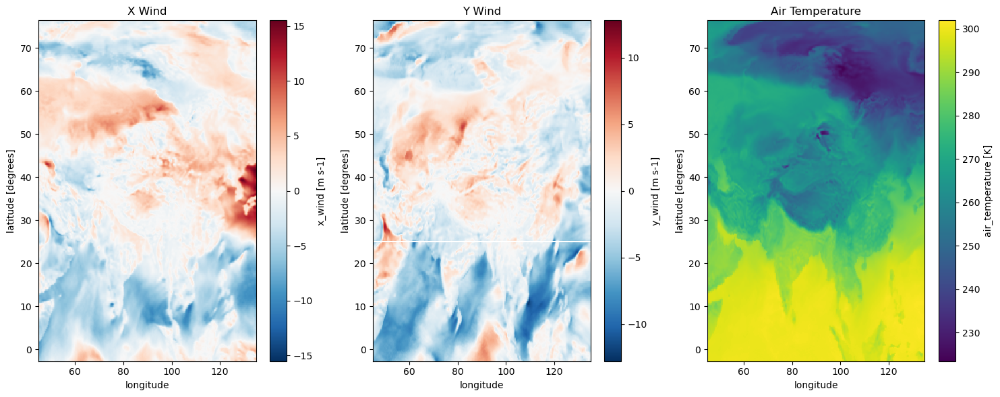

In [9]:
fig, axes = plt.subplots(nrows=1, ncols=len(variables), figsize=(5 * len(variables), 6))

# If there's only one subplot, wrap it in a list to keep indexing consistent
if len(variables) == 1:
    axes = [axes]

for i, var in enumerate(variables):
    data = ds[var].isel(model_level_number=0, time=0)  # Adjust these indices if needed
    data.plot(ax=axes[i])
    axes[i].set_title(var.replace('_', ' ').title())

plt.tight_layout()
plt.show()


# Iterate over all available met files

In [11]:
file_pattern = os.path.join(met_path, "*.nc")

Processing file: CHINA_Met_201401.nc


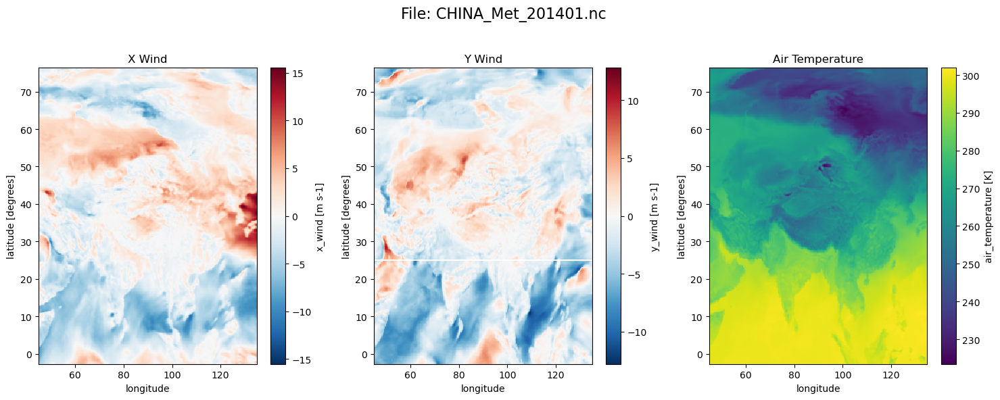

Processing file: CHINA_Met_201402.nc


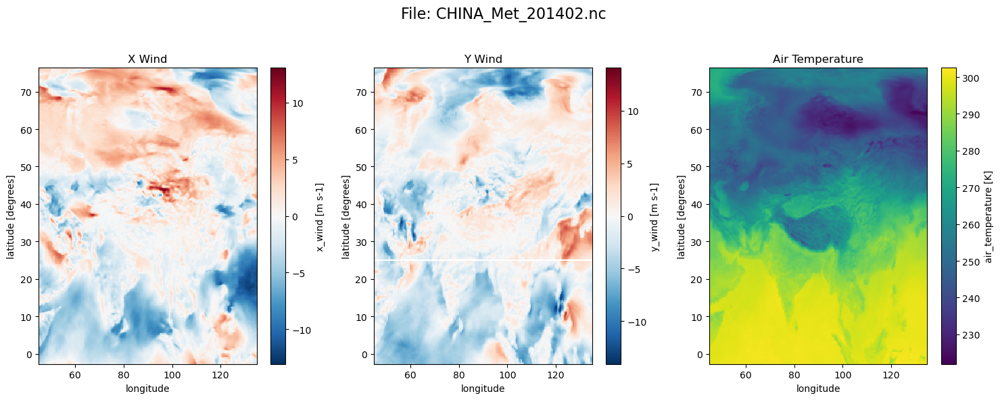

Processing file: CHINA_Met_201403.nc


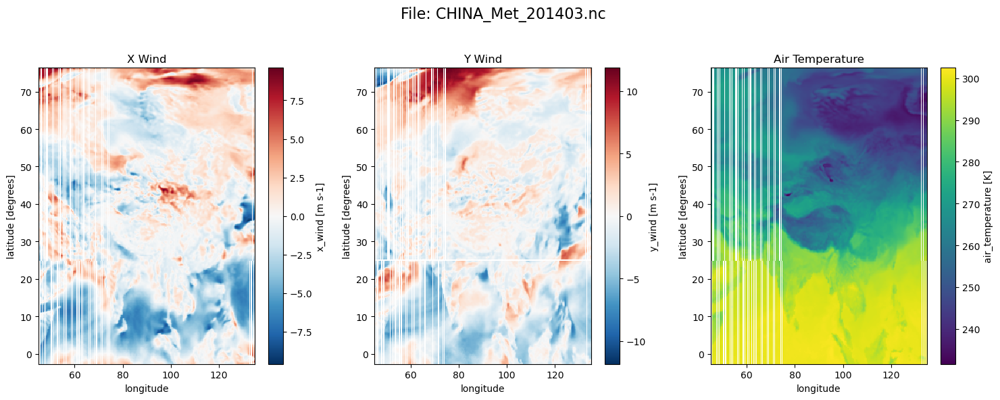

Processing file: CHINA_Met_201404.nc


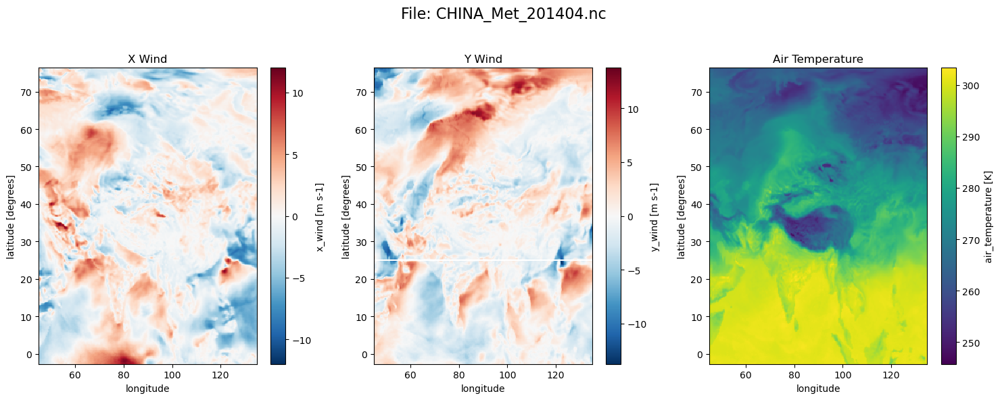

Processing file: CHINA_Met_201405.nc


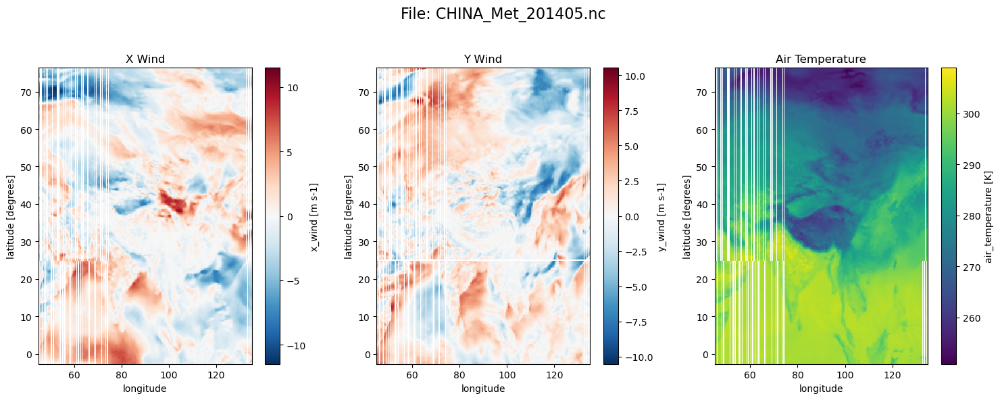

Processing file: CHINA_Met_201406.nc


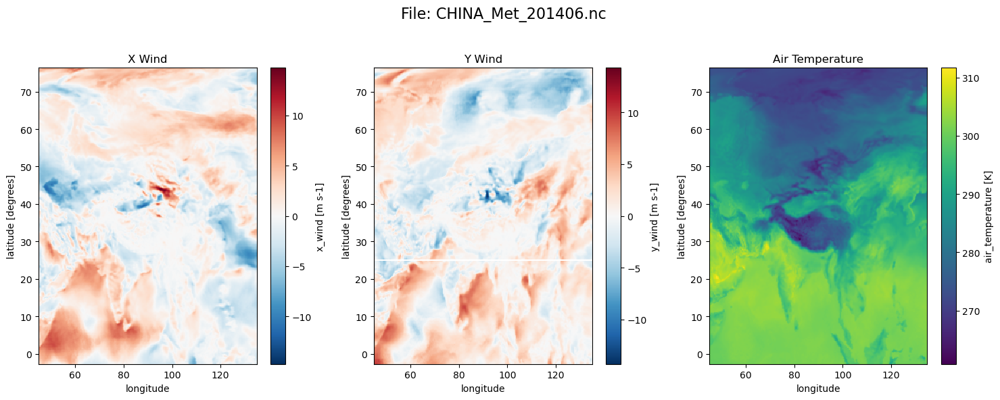

Processing file: CHINA_Met_201407.nc


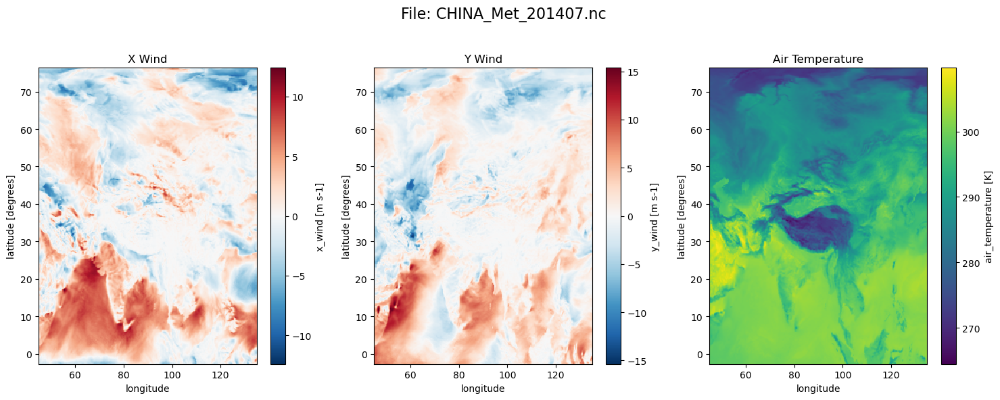

Processing file: CHINA_Met_201408.nc


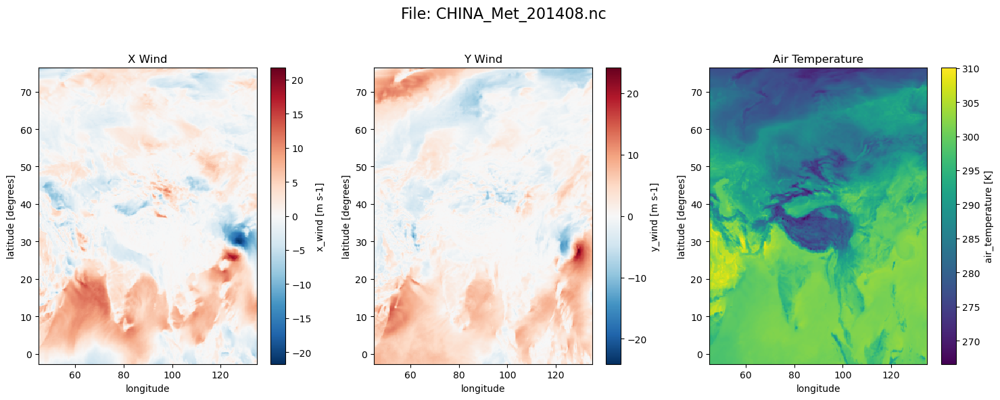

Processing file: CHINA_Met_201409.nc


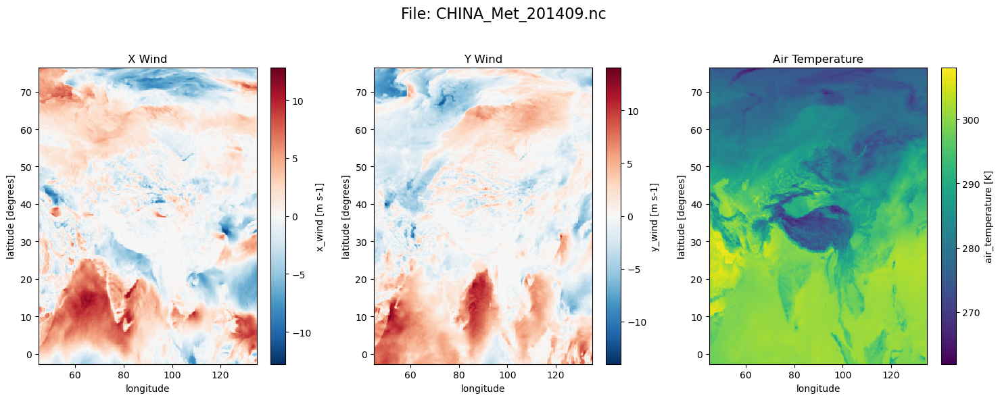

Processing file: CHINA_Met_201410.nc


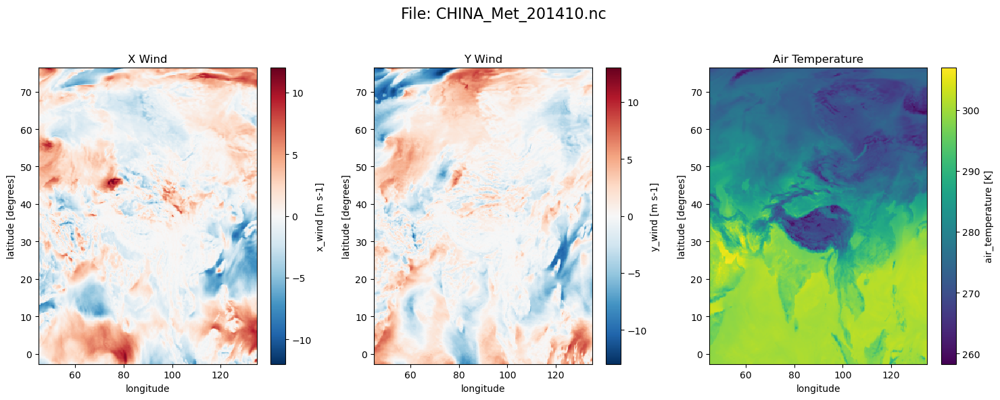

Processing file: CHINA_Met_201411.nc


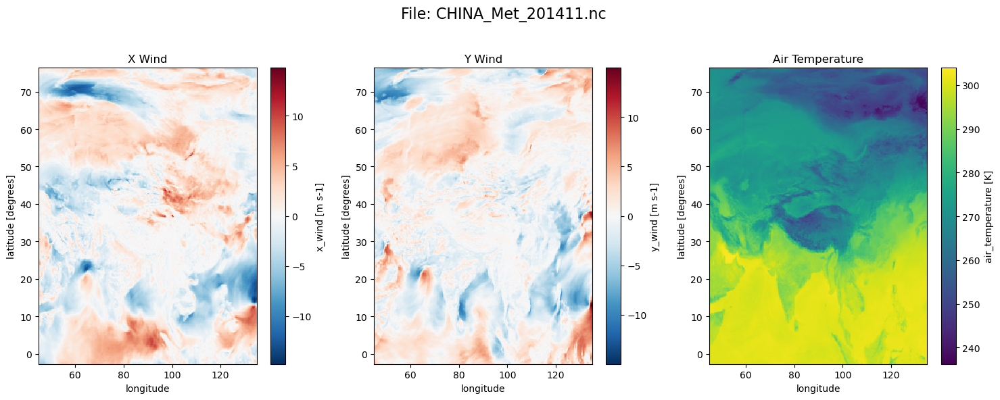

Processing file: CHINA_Met_201412.nc


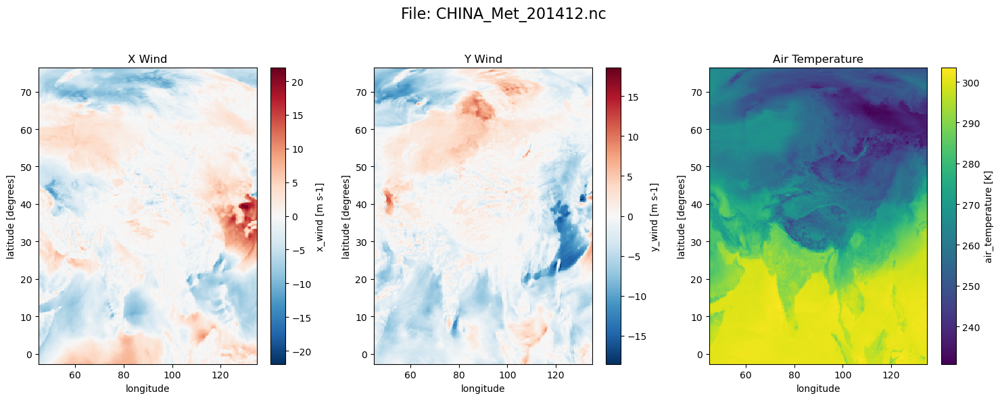

Processing file: CHINA_Met_201501.nc


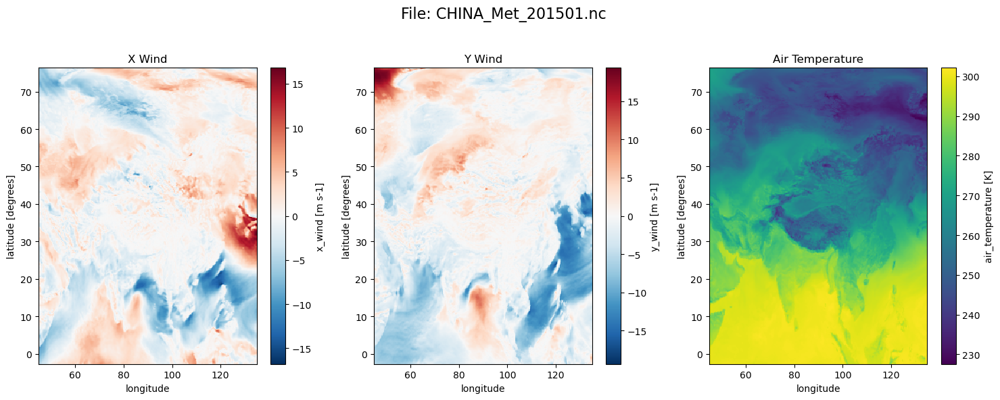

Processing file: CHINA_Met_201502.nc


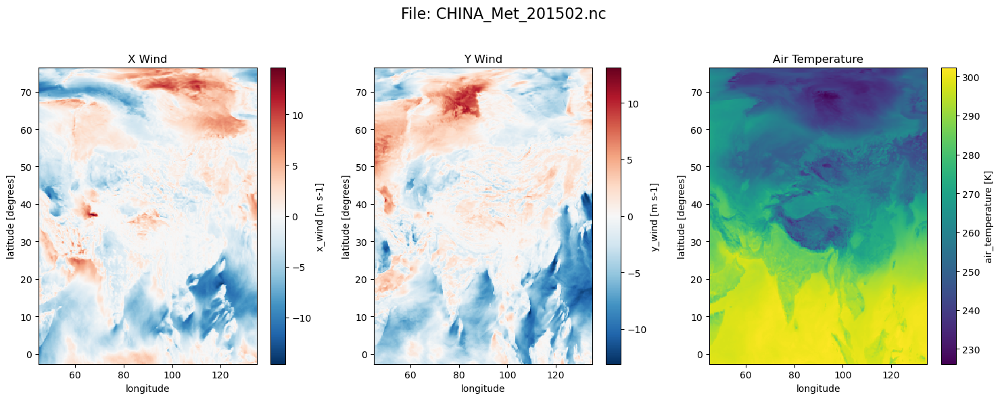

Processing file: CHINA_Met_201503.nc


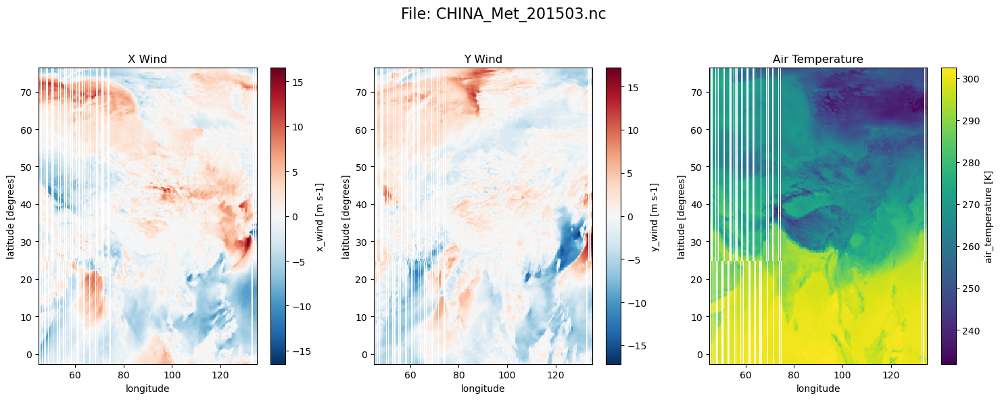

Processing file: CHINA_Met_201504.nc


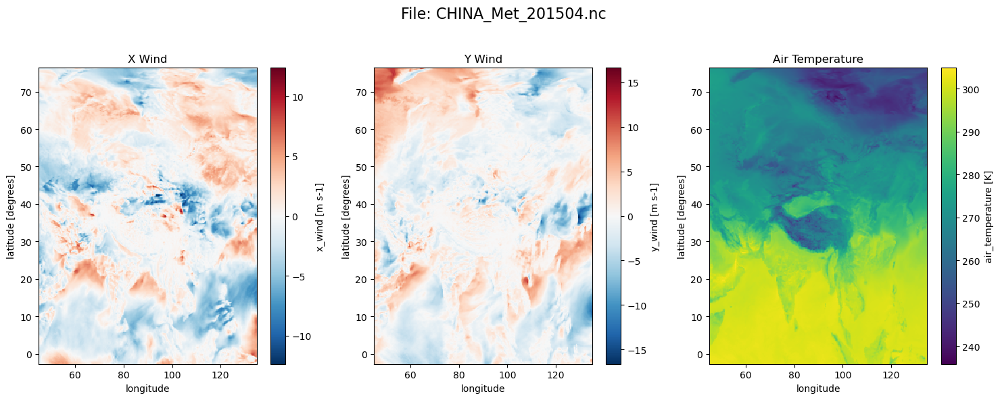

Processing file: CHINA_Met_201505.nc


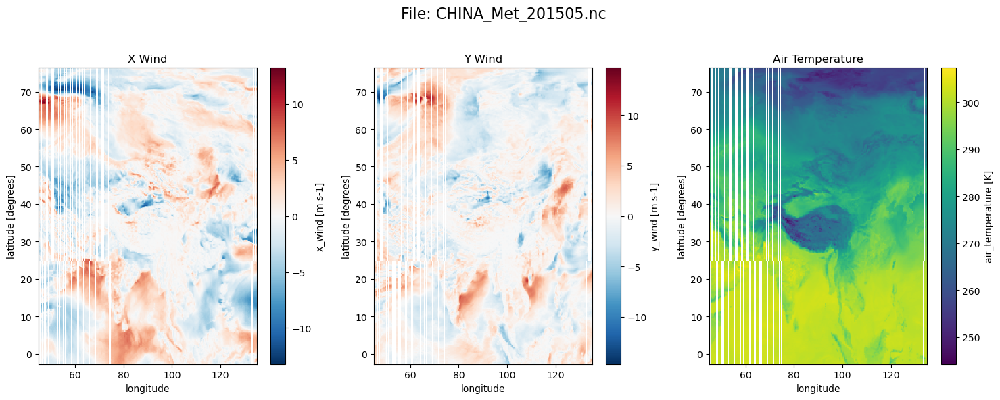

Processing file: CHINA_Met_201506.nc


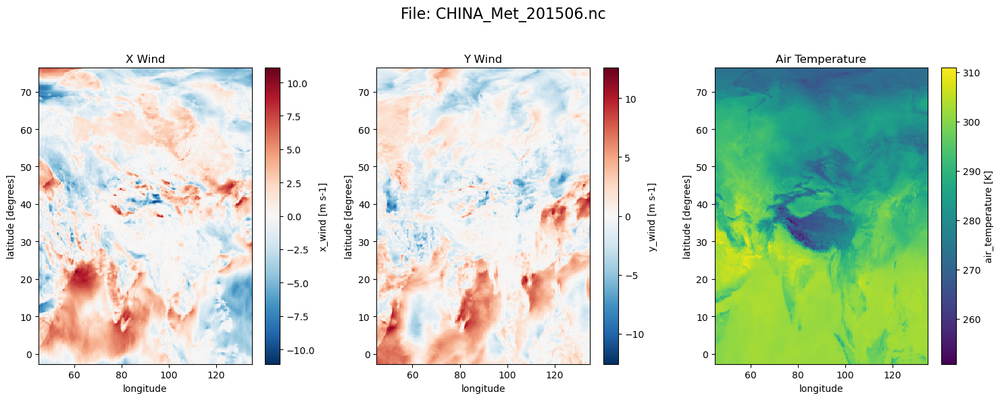

Processing file: CHINA_Met_201507.nc


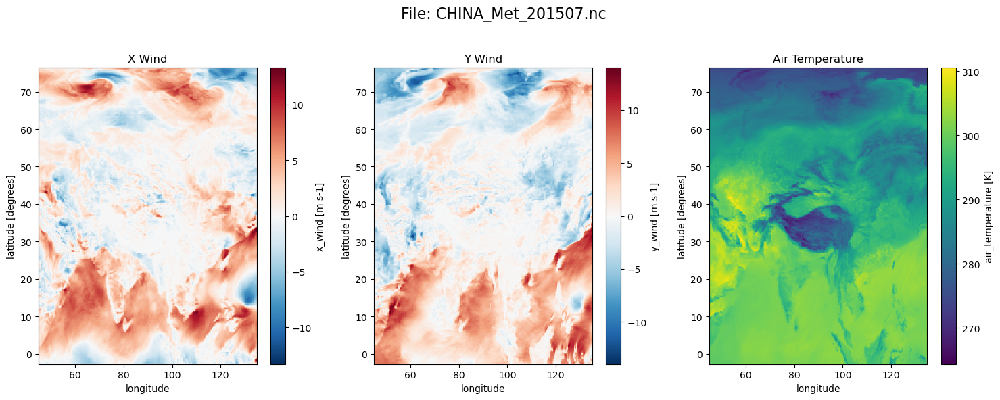

Processing file: CHINA_Met_201508.nc


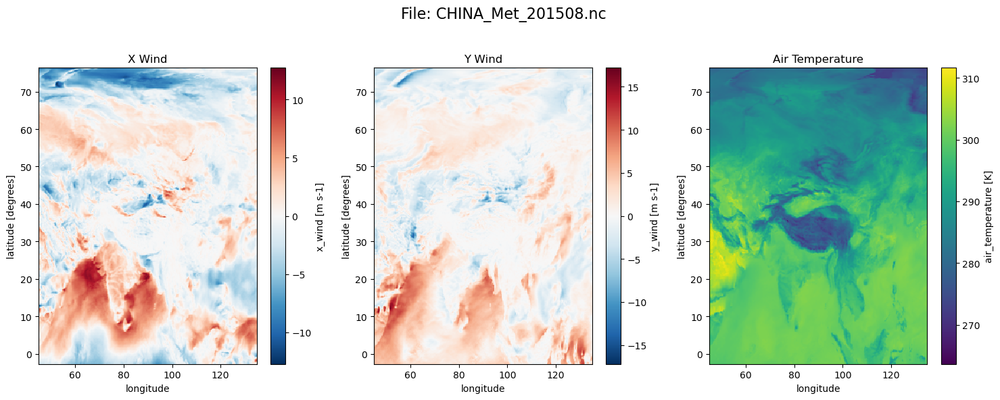

Processing file: CHINA_Met_201509.nc


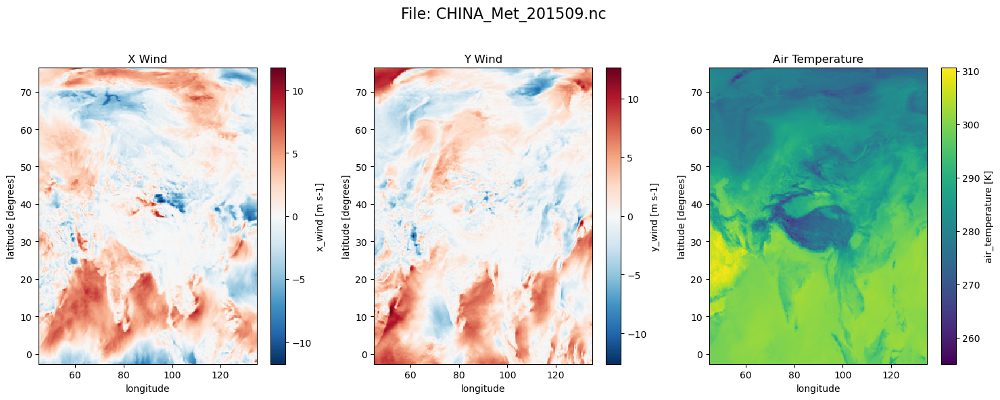

Processing file: CHINA_Met_201510.nc


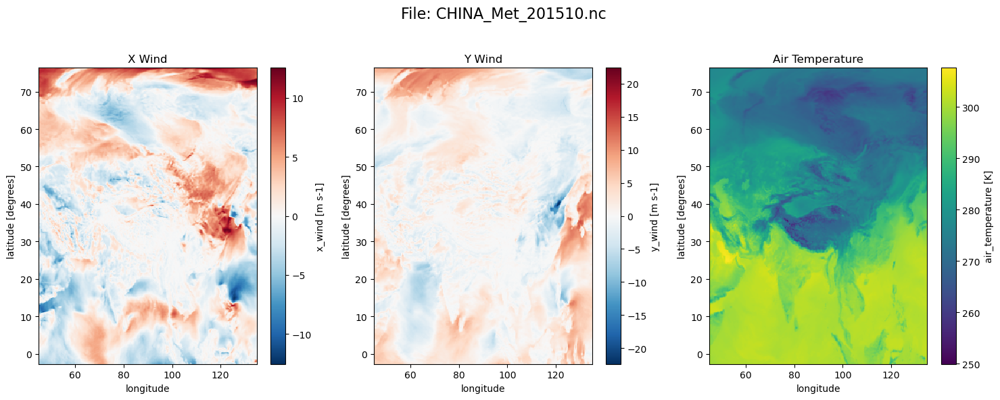

Processing file: CHINA_Met_201511.nc


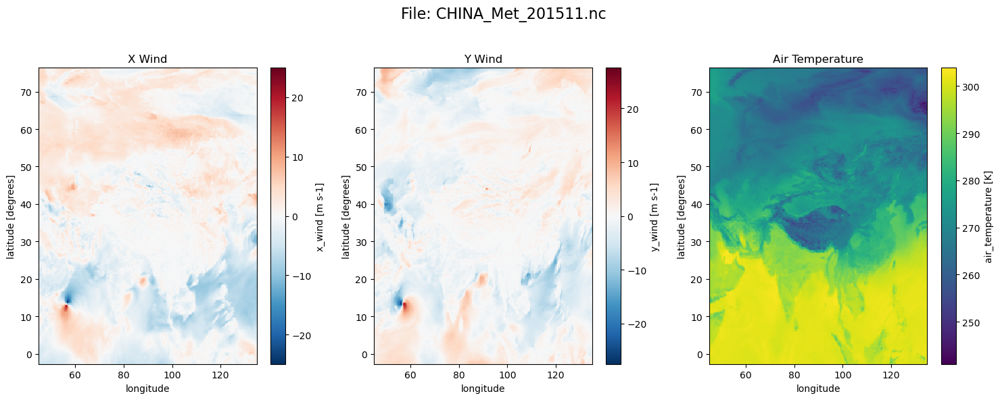

Processing file: CHINA_Met_201512.nc


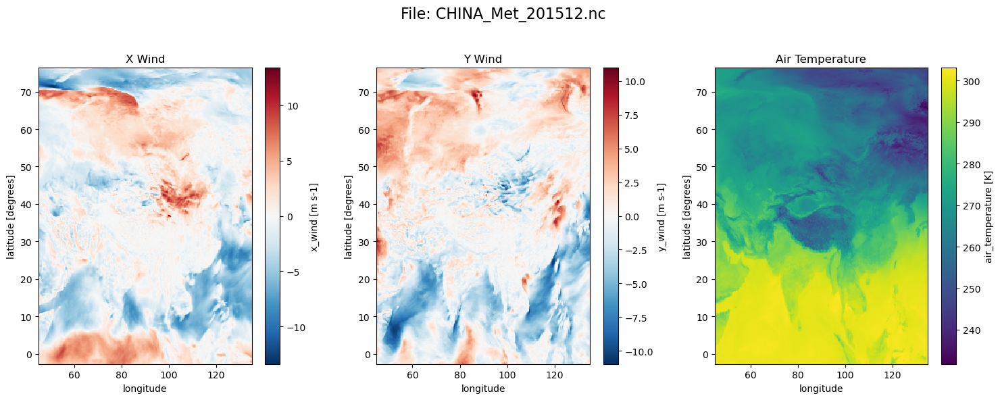

Processing file: CHINA_Met_201601.nc


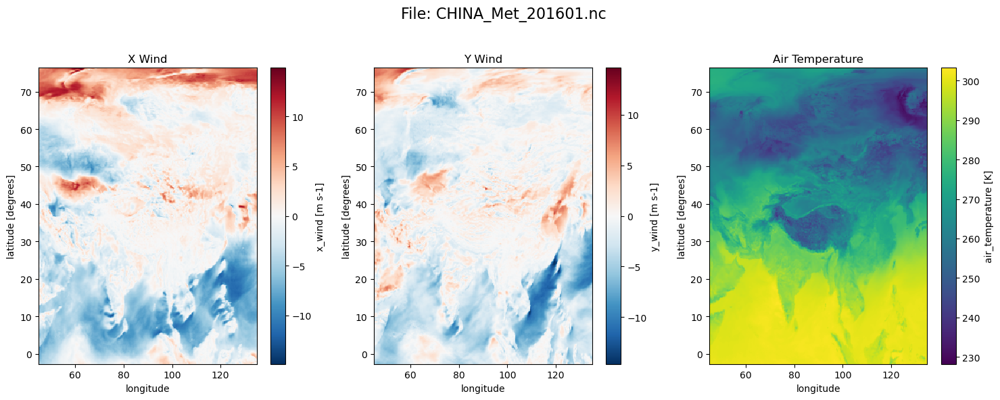

Processing file: CHINA_Met_201602.nc


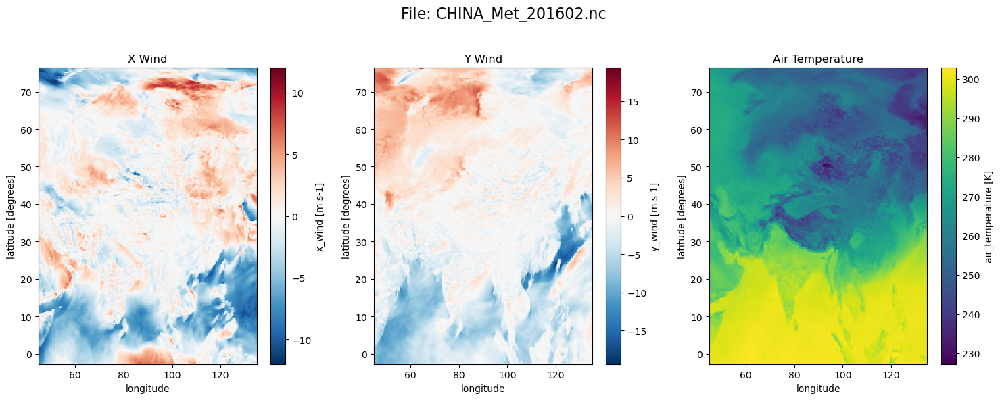

Processing file: CHINA_Met_201603.nc


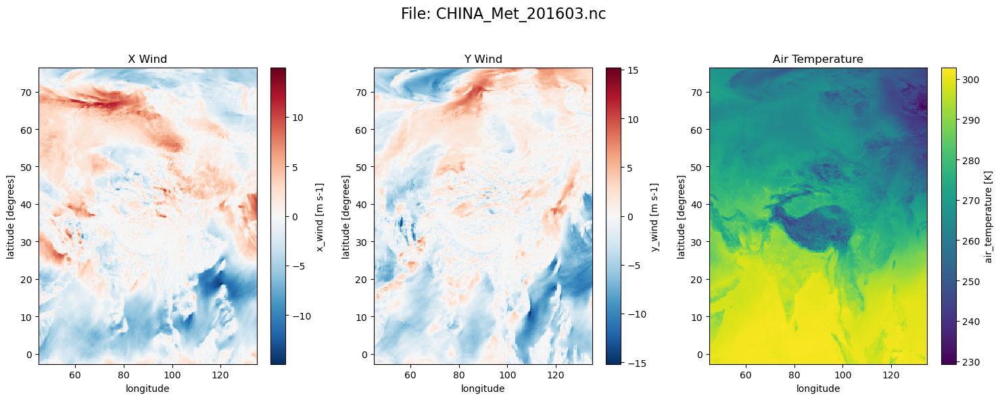

Processing file: CHINA_Met_201604.nc


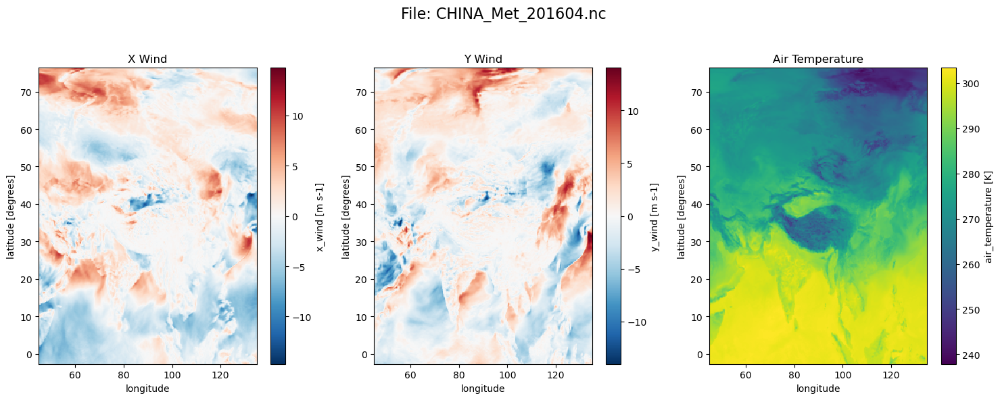

Processing file: CHINA_Met_201605.nc


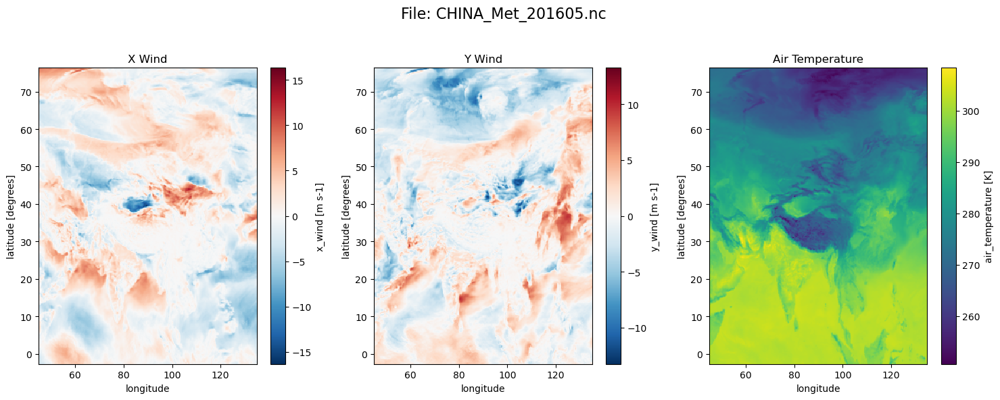

Processing file: CHINA_Met_201606.nc


In [ ]:
for file_path in glob.glob(file_pattern):
    try:
        ds = xr.open_dataset(file_path)
        
        # Extract filename only for title
        file_name = os.path.basename(file_path)
        print(f"Processing file: {file_name}")

        # Create subplots
        fig, axes = plt.subplots(1, len(variables), figsize=(5 * len(variables), 6))
        if len(variables) == 1:
            axes = [axes]  # Ensure iterable

        for i, var in enumerate(variables):
            if var in ds:
                data = ds[var].isel(model_level_number=0, time=0)  # Adjust slice as needed
                data.plot(ax=axes[i])
                axes[i].set_title(var.replace('_', ' ').title())
            else:
                axes[i].set_visible(False)
                print(f"Variable {var} not found in {file_name}")

        # Add a super-title with the filename
        plt.suptitle(f"File: {file_name}", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for suptitle
        plt.show()

        ds.close()

    except Exception as e:
        print(f"Error processing {file_path}: {e}")